In [18]:
include("speciale_tools.jl")
import JLD
import PyPlot

In [19]:
data_folder = "/home/data/simon/processed/test_areas/houston_new/flood"
figure_folder = "/home/data/simon/result/HSBA_loss2/HSBA_houston"

VV = [JLD.load(joinpath(data_folder,"VV_co.jld"),"data"),
    JLD.load(joinpath(data_folder,"VV_pre_median.jld"),"data")]


VH = [JLD.load(joinpath(data_folder,"VH_co.jld"),"data"), 
    JLD.load(joinpath(data_folder,"VH_pre_median.jld"),"data")];


In [20]:
figure_folder = "/home/data/simon/result/NONONON"

"/home/data/simon/result/NONONON"

In [21]:
data_folder = "/home/data/simon/processed/test_areas/houston_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
gamma = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)]
gamma_co = copy(gamma[1][:,end:-1:1])
gamma_pre = copy((sum(gamma[2:end])./length(gamma[2:end]))[:,end:-1:1]);
gamma= 0

0

In [22]:
k = 1

1

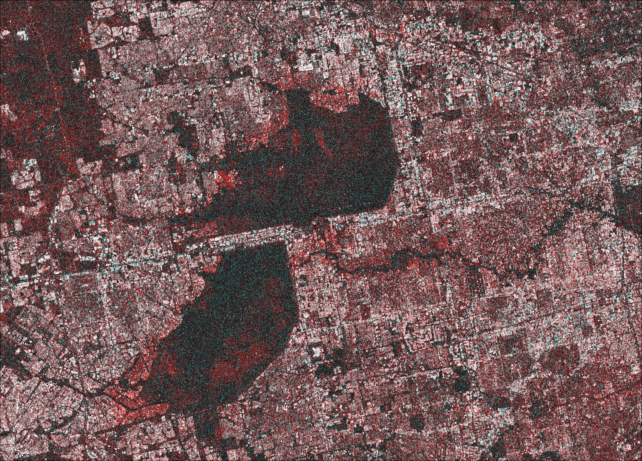

In [23]:
 img_coh = Colors.RGB.(gamma_pre.^k,gamma_co.^k,gamma_co.^k)

In [24]:
building_mask = JLD.load(
    "/home/data/simon/processed/test_areas/building_maps/houston/combi_long_hand.jld","data")[:,end:-1:1];

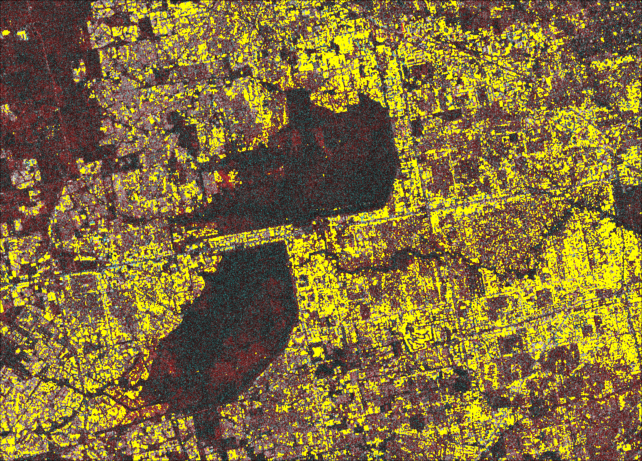

In [25]:
add_mask(img_coh,building_mask,(1,1,0))

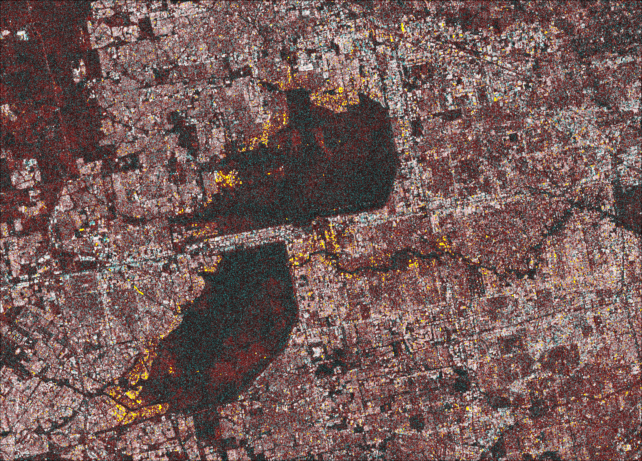

In [26]:
add_mask(img_coh,((gamma_co.-gamma_pre).<-0.4 ).& (gamma_pre .> 0.6) ,(1,1,0))

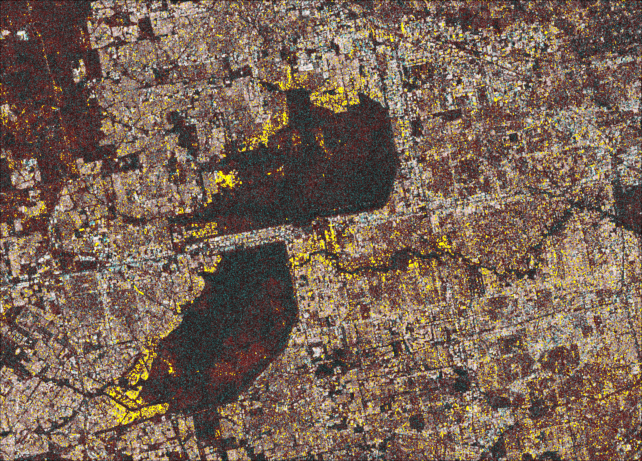

In [27]:
add_mask(img_coh,((gamma_co.-gamma_pre).<-0.3 ).& (gamma_pre .> 0.5) ,(1,1,0))

In [66]:
test, steps = region_growing(((gamma_co.-gamma_pre).<-0.4 ).& (gamma_pre .> 0.7) .& (change_band .>2),
    ((gamma_co.-gamma_pre).<-0.2 ).& (gamma_pre .> 0.4) .& (change_band .>1));

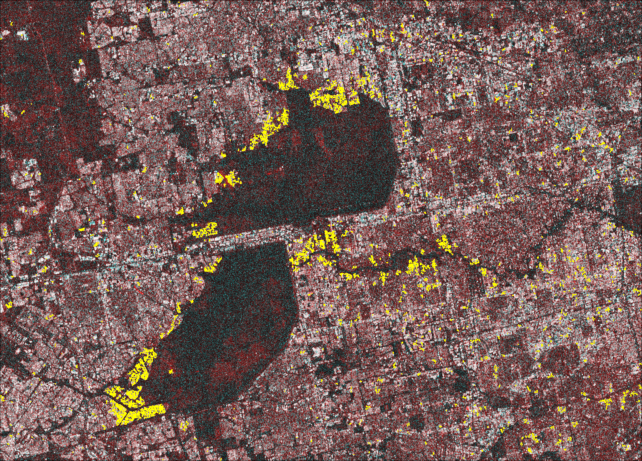

In [67]:
add_mask(img_coh,test ,(1,1,0))

In [68]:
steps 

46

In [31]:
function find_bimodal_tiles_v2(data,building_mask; N_limit = (10^3, 3*10^5), bin_size=50,conditions=(2,0.99,0.1),max_iter=10000)
    
    # initialize mask
    dims = size(data)
    N = length(data[.!building_mask])
    BM_mask = zeros(Bool,dims...)
    
    # If area is to small return false and exit function
    # serves as a lower limit for the recursive function
    if N < N_limit[1]
        return BM_mask
    end
    
    # If N is under max limit check for bimodal 
    bm_tile = false
    if N < N_limit[2]
        n_bins = round(Int64,N/bin_size)
        bm_tile, cons = bimodal_tile(reshape(data,:)[reshape(.!building_mask,:)],
                            n_bins,conditions=conditions,max_iter=max_iter) 
    end
    
    
    if bm_tile
        BM_mask .= true
    else
        # If tile not bimodal, Split it in 4 and try again
        row_split = floor(Int64,dims[1]/2)
        col_split = floor(Int64,dims[2]/2)
        
        tiles = [(1:row_split,1:col_split),((row_split+1):dims[1],1:col_split),
            (1:row_split,(col_split+1):dims[2]),((row_split+1):dims[1],(col_split+1):dims[2])]
        
        for elem in tiles
            BM_mask[elem...] .= find_bimodal_tiles_v2(data[elem...],building_mask[elem...],
                N_limit =N_limit, bin_size=bin_size,conditions=conditions,max_iter=max_iter)
        end
        
    end
    
    return BM_mask
end

find_bimodal_tiles_v2 (generic function with 1 method)

In [32]:
length(gamma_pre[.!building_mask])

949475

## VV

In [33]:
co = VV[1][:,end:-1:1]
pre = VV[2][:,end:-1:1];

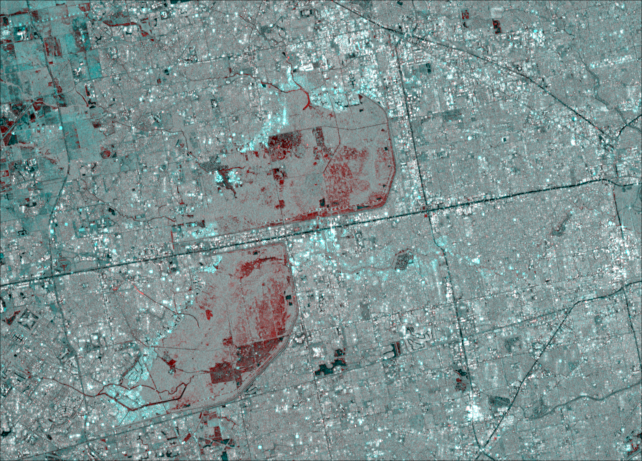

In [34]:
imgVV = pretty_img([co,pre],min_vv,max_vv)

In [35]:
flood_band = 10 .*log10.(co);
ref_band = 10 .*log10.(pre);
change_band = flood_band .- ref_band;

In [36]:
# Find the tiles to fit bimodal
bm_mask_flood = find_bimodal_tiles_v2(flood_band,building_mask);
bm_mask_change = find_bimodal_tiles_v2(change_band,building_mask);
bm_mask = bm_mask_change.&bm_mask_flood;


In [37]:
subset_edges = get_edges(bm_mask);
img_save = add_mask(imgVV,subset_edges,(1,1,1))

#file_path = joinpath(figure_folder,"VV_tile_select_median")
#FileIO.save(file_path*".png",img_save)
#img_save

UndefVarError: UndefVarError: Misc not defined

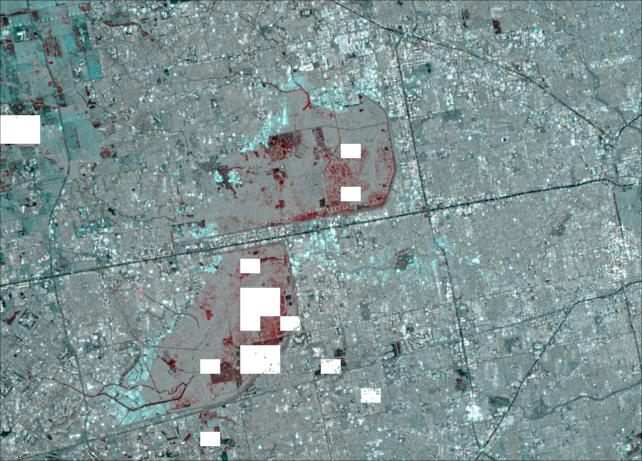

In [38]:
img_save = add_mask(imgVV,bm_mask .& .!building_mask,(1,1,1))

In [39]:
# fit bimodel
data = reshape(flood_band,:)[reshape(bm_mask .& .!building_mask,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

# Find seed pixels
y_seed =find_y_seed(p_fit,y)
seed_mask = flood_band .<y_seed;
y_seed

-13.425

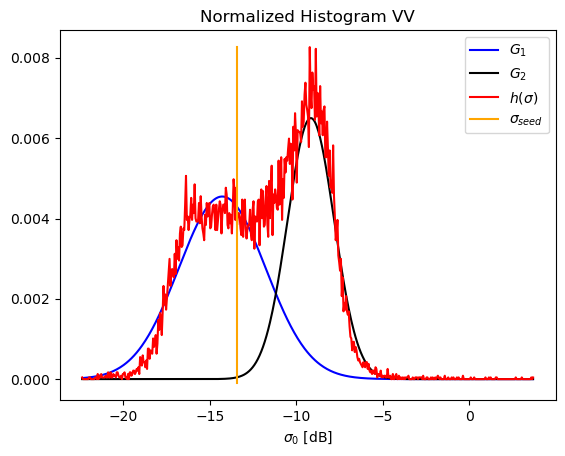

PyObject <matplotlib.legend.Legend object at 0x7f1700fda220>

In [40]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

In [41]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask .& .!building_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0; autodiff = :forward,store_trace = true,trace_simplex=true)
thresholds1 = res.minimizer
f1 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


([-11.723520650481806, -0.0946337782312189], 0.000193084011411398)

In [42]:
rg_thresholds = thresholds1

2-element Array{Float64,1}:
 -11.723520650481806 
  -0.0946337782312189

test_sigma = collect(LinRange(y_seed,-9,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

minimum(loss),maximum(loss)

file_path = joinpath(figure_folder,"VV_loss_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.00135,vmax=0.0017
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]")
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]")
PyPlot.colorbar()
PyPlot.title("Loss function: VV Houston")
PyPlot.savefig(file_path)

In [43]:
rg_mask = (flood_band .<rg_thresholds[1]) .& (change_band.<rg_thresholds[2]) .| seed_mask 
flood_mask, steps = region_growing(seed_mask,rg_mask);

In [44]:
# select the water pixelss in the selected tiles
data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask .& .!building_mask,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

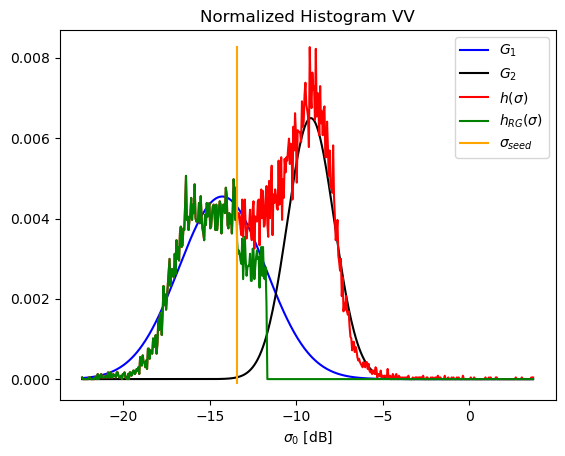

PyObject <matplotlib.legend.Legend object at 0x7f171c8edf70>

In [45]:
#file_path = joinpath(figure_folder,"VV_histogram_flood.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

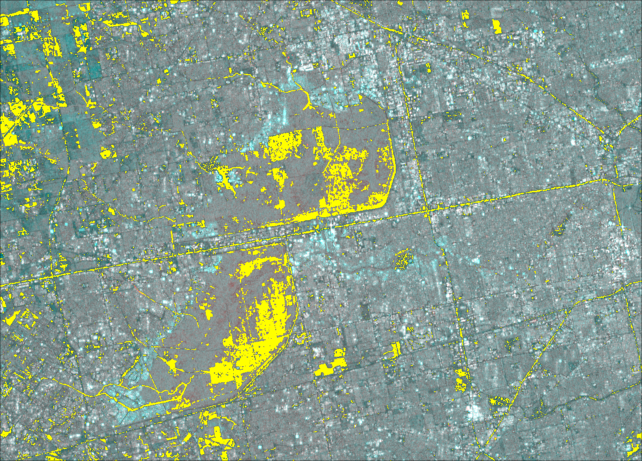

In [46]:
img_save = add_mask(imgVV,flood_mask,(1,1,0))
#file_path = joinpath(figure_folder,"VV_flood_noref")
#FileIO.save(file_path*".png",img_save)
#img_save

In [47]:
seed_mask_ref = ref_band .<y_seed
rg_mask_ref = (ref_band .<rg_thresholds[1]) .| seed_mask_ref
ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);
    
# Remove flase positives and permant water.
final_mask = flood_mask .& .!ref_mask .& .!building_mask;

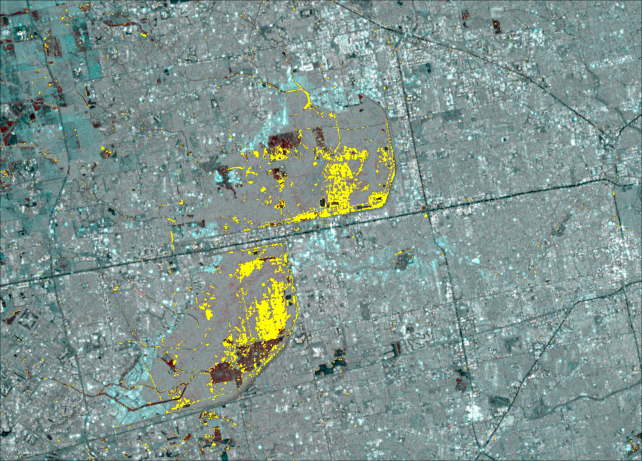

In [48]:
img_save = add_mask(imgVV,final_mask,(1,1,0))


In [49]:
data = reshape(gamma_co.-gamma_pre,:)[reshape(building_mask,:)];

In [50]:
round(Int,length(data)/100)

2322

In [51]:
# select the water pixelss in the selected tiles

data = reshape(gamma_co.-gamma_pre,:)[reshape(building_mask,:)];
    
h = StatsBase.fit(StatsBase.Histogram, data,nbins=round(Int,length(data)/100))
w = h.weights
edges = collect(h.edges[1])
y = (edges[2:end] +  edges[1:end-1])/2;
w_sum = sum(w)
# normalise
w = w./w_sum;


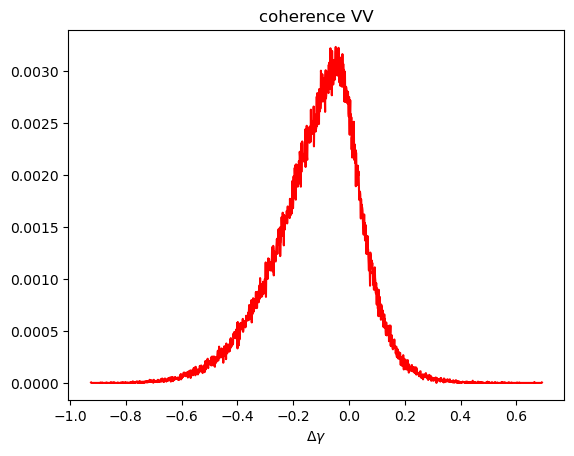

PyObject Text(0.5, 1.0, 'coherence VV')

In [52]:
PyPlot.figure()


PyPlot.plot(y,w,color="r")
PyPlot.xlabel("\$ \\Delta \\gamma \$")
PyPlot.title("coherence VV")

#PyPlot.savefig(file_path)

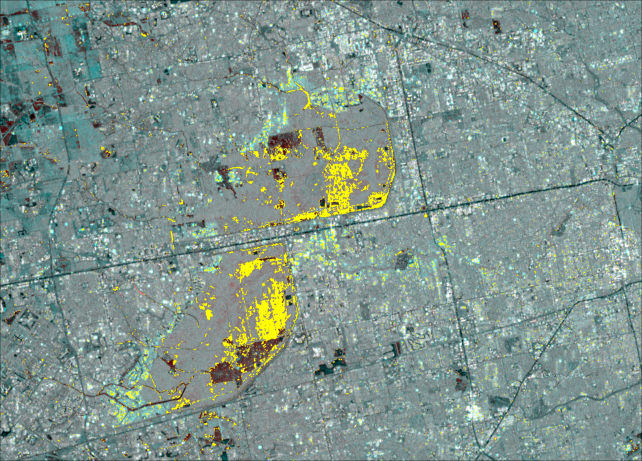

In [53]:
img_save = add_mask(imgVV,final_mask,(1,1,0))
img_save = add_mask(img_save,building_mask .& (((gamma_co.-gamma_pre).<-0.3) .& (change_band .>2)),(1,1,0))

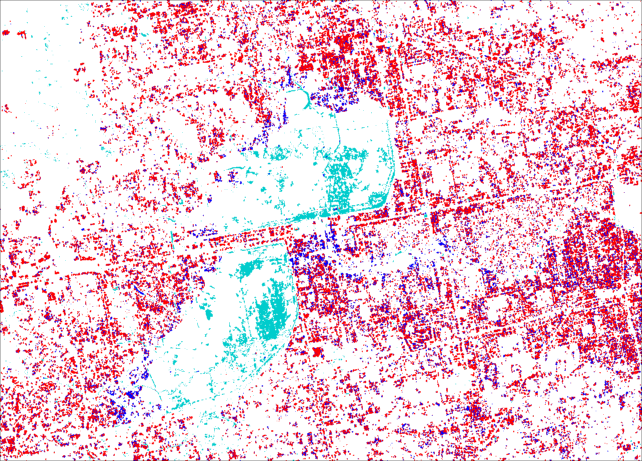

In [54]:
blank = Colors.RGB.(ones(Float32,size(co)),ones(Float32,size(co)),ones(Float32,size(co)))
test = add_mask(blank,final_mask,(0,0.8,0.8))
test = add_mask(test,building_mask,(1,0,0))
test = add_mask(test,building_mask .& ((gamma_co.-gamma_pre).<-0.2),(0,0,1))

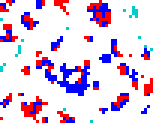

In [65]:
test[760:800,200:250]

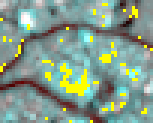

In [64]:
img_save[760:800,200:250]

In [69]:
VV_final_mask = copy(final_mask);

## VH

In [70]:
co = VH[1][:,end:-1:1]
pre = VH[2][:,end:-1:1];

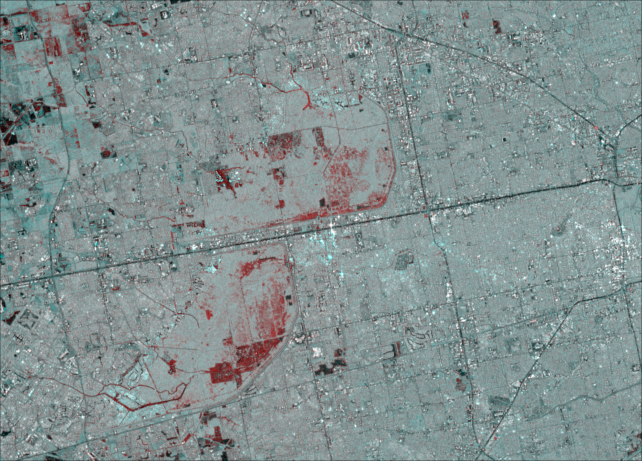

In [71]:
imgVH = pretty_img([co,pre],min_vh,max_vh)

In [72]:
flood_band = 10 .*log10.(co);
ref_band = 10 .*log10.(pre);
change_band = flood_band .- ref_band;

In [73]:
# Find the tiles to fit bimodal
bm_mask_flood = find_bimodal_tiles_v2(flood_band,building_mask);
bm_mask_change = find_bimodal_tiles_v2(change_band,building_mask);
bm_mask = bm_mask_change.&bm_mask_flood;


In [74]:
subset_edges = get_edges(bm_mask);
img_save = add_mask(imgVH,subset_edges,(1,1,1))

#file_path = joinpath(figure_folder,"VH_tile_select_median")
#FileIO.save(file_path*".png",img_save)
#img_save

UndefVarError: UndefVarError: Misc not defined

In [75]:
# fit bimodel
data = reshape(flood_band,:)[reshape(bm_mask .& .!building_mask,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

# Find seed pixels
y_seed =find_y_seed(p_fit,y)
seed_mask = flood_band .<y_seed;
y_seed

-20.075000000000003

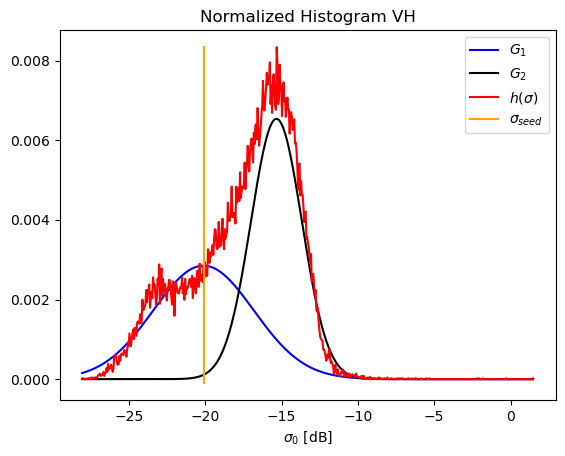

PyObject <matplotlib.legend.Legend object at 0x7f16ff0da310>

In [76]:
#file_path = joinpath(figure_folder,"VH_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

In [77]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask .& .!building_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0; autodiff = :forward,store_trace = true,trace_simplex=true)
thresholds1 = res.minimizer
f1 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


([-18.11655281172795, 0.5656303149087738], 0.0002056903153256291)

In [78]:
rg_thresholds = thresholds1

2-element Array{Float64,1}:
 -18.11655281172795  
   0.5656303149087738

test_sigma = collect(LinRange(y_seed,-16,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

minimum(loss),maximum(loss)

file_path = joinpath(figure_folder,"VH_loss_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.00038,vmax= 0.0005
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]")
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]")
PyPlot.colorbar()
PyPlot.title("Loss function: VH Houston")
PyPlot.savefig(file_path)

In [79]:
rg_mask = (flood_band .<rg_thresholds[1]) .& (change_band.<rg_thresholds[2]) .| seed_mask 
flood_mask, steps = region_growing(seed_mask,rg_mask);

In [80]:
# select the water pixelss in the selected tiles
data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask .& .!building_mask,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

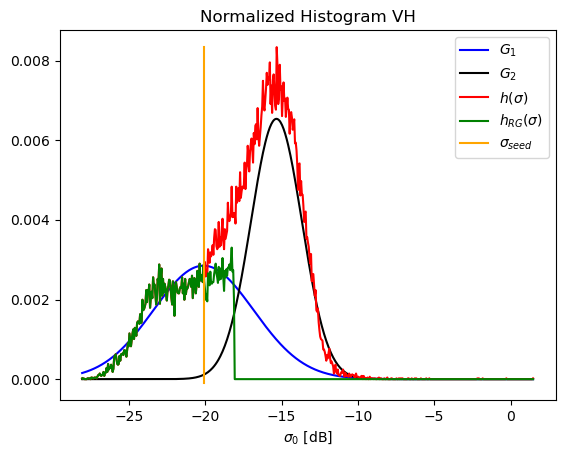

PyObject <matplotlib.legend.Legend object at 0x7f16ff0603a0>

In [81]:
#file_path = joinpath(figure_folder,"VH_histogram_flood.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

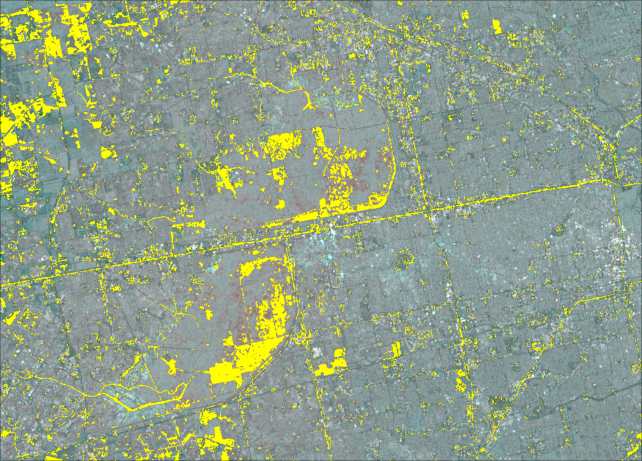

In [82]:
img_save = add_mask(imgVH,flood_mask,(1,1,0))
#file_path = joinpath(figure_folder,"VH_flood_noref")
#FileIO.save(file_path*".png",img_save)
#img_save

In [83]:
seed_mask_ref = ref_band .<y_seed
rg_mask_ref = (ref_band .<rg_thresholds[1]) .| seed_mask_ref
ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);
    
# Remove flase positives and permant water.
final_mask = flood_mask .& (ref_mask .!=true) .& .!building_mask;

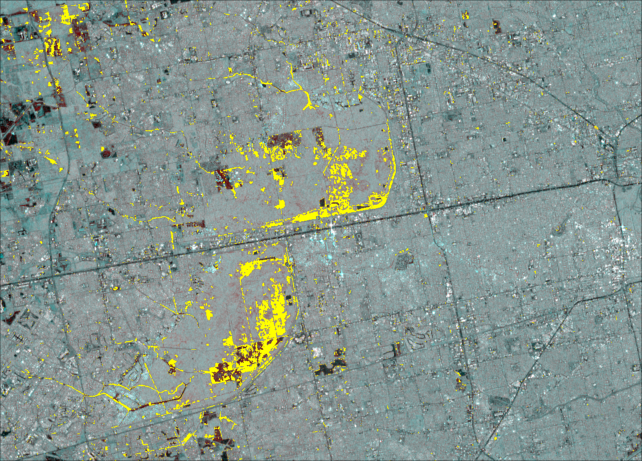

In [84]:
img_save = add_mask(imgVH,final_mask,(1,1,0))

#file_path = joinpath(figure_folder,"VH_flood")
#FileIO.save(file_path*".png",img_save)
#img_save

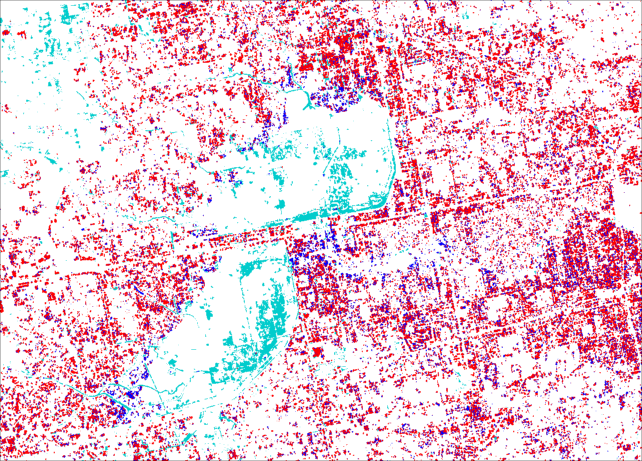

In [85]:
blank = Colors.RGB.(ones(Float32,size(co)),ones(Float32,size(co)),ones(Float32,size(co)))
test = add_mask(blank,final_mask,(0,0.8,0.8))
test = add_mask(test,building_mask,(1,0,0))
test = add_mask(test,building_mask .& ((gamma_co.-gamma_pre).<-0.2),(0,0,1))

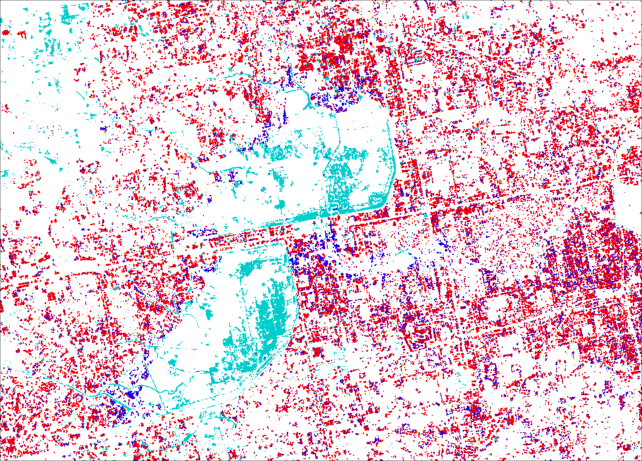

In [87]:
blank = Colors.RGB.(ones(Float32,size(co)),ones(Float32,size(co)),ones(Float32,size(co)))
test = add_mask(blank,final_mask.|VV_final_mask,(0,0.8,0.8))
test = add_mask(test,building_mask,(1,0,0))
test = add_mask(test,building_mask .& ((gamma_co.-gamma_pre).<-0.2),(0,0,1))

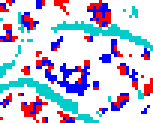

In [88]:
test[760:800,200:250]